# Enhanced Combined Drought Index

* **Products used:** 
[rainfall_chirps_daily](https://explorer.digitalearth.africa/products/rainfall_chirps_daily),
[rainfall_chirps_monthly](https://explorer.digitalearth.africa/products/rainfall_chirps_monthly),
[ls5_st](https://explorer.digitalearth.africa/products/ls5_st),
[ls7_st](https://explorer.digitalearth.africa/products/ls7_st),
[ls8_st](https://explorer.digitalearth.africa/products/ls8_st),
[ls9_st](https://explorer.digitalearth.africa/products/ls9_st),
[ls5_sr](https://explorer.digitalearth.africa/products/ls5_sr),
[ls7_sr](https://explorer.digitalearth.africa/products/ls7_sr),
[ls8_sr](https://explorer.digitalearth.africa/products/ls8_sr),
[ls9_sr](https://explorer.digitalearth.africa/products/ls9_st),
[s2_l2a](https://explorer.digitalearth.africa/products/s2_l2a),
[ndvi_climatology_ls](https://explorer.digitalearth.africa/products/ndvi_climatology_ls)

## Background


Drought is an extended period, during which, fresh water availability and accessibility for the ecosystem at a given time and place is below normal, due to unfavourable spatial and temporal distribution of rainfall, temperature, soil moisture and wind characteristics [(Balint et al., 2013)](https://doi.org/10.1016/B978-0-444-59559-1.00023-2). Severe droughts can affect large populations, leading to a long-term threat to people’s livelihoods and result in tremendous economic loss [(Enenkel et al., 2016)](https://doi.org/10.3390/rs8040340).

The Enhanced Combined Drought Index aims at the timely and reliable detection of drought events with regard to their spatio-temporal extent and severity. The Enhanced Drought Index is a combination of the following: a precipitation component, which considers rainfall deficits and dryness persistence; a soil moisture component, which considers soil moisture deficits and deficit persistence; a vegetation component which considers NDVI deficits and deficit persistence; and a temperature component, which considers temperature excesses and persistence of high temperatures. The index uses satellite-derived rainfall, soil moisture, land surface temperature and vegetation status as input datasets. [(Enenkel et al., 2016)](https://doi.org/10.3390/rs8040340)

The drought index calculated using the precipitation component is referred as the **Precipitation Drought Index (PDI)**, while the index based on temperature is named as **Temperature Drought Index (TDI)**, the index based on soil moisture is named as the **Soil Moisture Drought Index** and that based on the vegetation component is named as **Vegetation Drought Index (VDI)**.

Each drought index can be expressed as:

$\text{Drought Index} = \frac{\text{Actual Average for Interest Period}}{\text{Long Term Mean for Interest Period}} * \frac{\text{Actual Length of Continuous Deficit or Excess in the Interest Period}}{\text{Long Term Mean of Continuous Deficit or Excess in the Interest Period}}$

Each drought index is calculated similarly. The equation below illustrates the calculation of the ECDI precipitation component:

\begin{equation}
\text{PDI}_{y,m} = \frac{\sum_{j=0}^{\text{IP} - 1} P^*_{y,(m-j)}}{\frac{1}{n}\sum_{k=1}^n[\sum_{j=0}^{\text{IP} - 1} P^*_{(m-j), k}]} * \sqrt{\frac{(\text{RL}^*)P^*_{m, y}}{\frac{1}{n}\sum_{k=1}^{n}(\text{RL}^*)P^*_{m, k}}}
\end{equation}

- $\text{PDI}_{y,m}$ is the Precipitation Drought Index for year $\text{y}$ and month $\text{m}$

- $P^*$ is the modified monthly precipitation average 

- $\text{RL*}(P*)$ (run length) is the maximum number of successive months below long-term average rainfall in the interest period

- $\text{IP}$ is the interest period (e.g. 3, 4, 5, . . . months) (longer IPs detect more severe drought events). In this notebook the interest period is 1 month. 

- $\text{RL}*$ is the modified run length parameter 

- $n$ is the number of years where relevant data are available,

- $j$ is the summation running parameter covering the Interest Period

- $k$ is the summation parameter covering the years where relevant data are available

- $m$ time unit (month) 

- $y$ year

The raw time series of temperature and precipitation as well as the run length are modified to adjust the range of all variables and to avoid a division by zero.

\begin{equation}
T^* = (T_{max} + 1) - T
\end{equation}

\begin{equation}
P^* = P + 1
\end{equation}

\begin{equation}
RL^* = (RL_{max} + 1) - RL
\end{equation}

All the individual drought indices differ in range. To improve their interpretability and visual comparability a simple scaling factor is introduced.

\begin{equation}
PDI_{scaled} = \frac{(PDI - PDI_{min})}{(PDI_{max} - PDI_{min})}
\end{equation}

The weight of each individual drought index is automatically calculated for every grid point (pixel) with respect to its capability to reflect the future vegetation status (NDVI) and multiplied by the respective individual index to calculate the ECDI. In the case of data gaps in one input dataset, the weights are automatically redistributed to other available variables.

\begin{equation}
ECDI = \sum_{i-1}^{n}w_{i} * DI_{i}
\end{equation}

- $ECDI$ Enhanced Combined Drought Index 

- $w$ Weight for each individual drought index (e.g., rainfall)

- $DI$ Individual drought index 

- $n$ number of drought indices used to calculate the ECDI 

- $i$ running parameter covering the number of drought indices

\begin{equation}
w_{i} = \frac{\frac{lag^*_{i}}{\sum_{j=1}^{n} lag^*_{j}} + \frac{corr^*_{i}}{\sum_{j=1}^{n} corr^*_{j}}}{2}
\end{equation}


- $w$ weight for the respective drought index 

- $lag^*$ modified time lag for the respective parameter 

- $corr^*$ modified correlation coefficient for the respective parameter 

- $i$ index for the respective parameter/drought index 

- $j$ running parameter covering all parameters used for the ECDI calculation

- $n$ number of individual drought indices used for the ECDI calculation


## Description



The notebook outlines:

***

## Getting started

To run this analysis, run all the cells in the notebook, starting with the "Load packages" cell. 

### Load packages


In [1]:
%matplotlib inline

import math
import os
import pickle
from datetime import datetime

import datacube
import geopandas as gpd
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import xarray as xr
from datacube.utils.geometry import CRS, Geometry
from deafrica_tools.dask import create_local_dask_cluster
from deafrica_tools.bandindices import calculate_indices
from deafrica_tools.spatial import xr_rasterize

/usr/local/lib/python3.8/dist-packages/geopandas/_compat.py:112: UserWarning: The Shapely GEOS version (3.8.0-CAPI-1.13.1 ) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


### Set up a Dask cluster

Dask can be used to better manage memory use and conduct the analysis in parallel. 
For an introduction to using Dask with Digital Earth Africa, see the [Dask notebook](../../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

>**Note**: We recommend opening the Dask processing window to view the different computations that are being executed; to do this, see the *Dask dashboard in DE Africa* section of the [Dask notebook](../../Beginners_guide/08_Parallel_processing_with_dask.ipynb).

To use Dask, set up the local computing cluster using the cell below.

In [2]:
create_local_dask_cluster()

Client Scheduler: tcp://127.0.0.1:42687 Dashboard: /user/victoria@kartoza.com/proxy/8787/status,Cluster Workers: 1 Cores: 15 Memory: 104.37 GB


### Analysis parameters

The following cell sets important parameters for the analysis:

* `vector_file`: file path for the shapefile containing polygons for the boundaries of Kenyan counties
* `attribute_col`: The column in the "vector_file" containing the county names.
* `county`: In this analysis, we'll select a Kenyan County to mask the dataset and analysis.
* `time_range`: This is the range of years for which data is available. Because Landsat surface reflectance and surface temperature data is available only from April 1984, the computation of the ECDI was limited to the period April, 1992 to present.
* `resolution`: The x and y cell resolution of the satellite data in metres (spatial resolution). We'll use 5,000 m, which is approximately equal to the default CHIRPS resolution.
* `output_crs` : The coordinate reference system that the loaded data is to be reprojected to.
* `dask_chunks`:  the size of the dask chunks, dask breaks data into manageable chunks that can be easily stored in memory, e.g. `dict(x=1000,y=1000)`
* `output_dir` :  The directory in which to store results from the analysis.
* `min_num_obs` : The minimum number of clear observations for creating a quality assurance mask for the NDVI climatology. The minimum number of clear observations should be ~20-30 observations.

**If running the notebook for the first time**, keep the default settings below.
This will demonstrate how the analysis works and provide meaningful results.


In [3]:
vector_file = "../data/Kenya_Counties.geojson"
attribute_col = "COUNTY_NAME"
# Select a county, for the example we will use Turkana County, a complete list of counties is available below.
county = "Turkana"

#vector_file = "../data/african_countries.geojson"
#attribute_col = "COUNTRY"
#county = "Ethiopia"

# Define the time range to load data for. 
time_range = ("1984-04", "2022-05")

# Set the x and y cell resolution of the satellite data.
# CHIRPS has a spatial resolution of ~5x5 km.
resolution = (-5000, 5000)

# Set the CRS the satellite data is to be reprojected to.
output_crs = "EPSG:6933"

# Size of dask chunks.
dask_chunks = dict(x=5000, y=5000)

# Create the output directory to store the results.
output_dir = "results"
os.makedirs(output_dir, exist_ok=True)

min_num_obs = 20

### Connect to the datacube

Connect to the datacube so we can access DE Africa data.
The `app` parameter is a unique name for the analysis which is based on the notebook file name.

In [4]:
dc = datacube.Datacube(app="ECDI")

### Load the Kenyan Counties shapefile

This shapefile contains polygons for the boundaries of Kenyan counties and will allows us to calculate the Enhanced Combined Drought Index within a chosen county.

In [5]:
kenyan_counties = gpd.read_file(vector_file)
kenyan_counties.explore()

### List counties

You can change the county in the analysis parameters cell to any Kenyan county. 
A complete list of counties is printed below.

In [6]:
print(np.unique(kenyan_counties[attribute_col]))

['Baringo' 'Bomet' 'Bungoma' 'Busia' 'Elgeyo-Marakwet' 'Embu' 'Garissa'
 'Homa Bay' 'Isiolo' 'Kajiado' 'Kakamega' 'Kericho' 'Kiambu' 'Kilifi'
 'Kirinyaga' 'Kisii' 'Kisumu' 'Kitui' 'Kwale' 'Laikipia' 'Lamu' 'Machakos'
 'Makueni' 'Mandera' 'Marsabit' 'Meru' 'Migori' 'Mombasa' "Murang'a"
 'Nairobi' 'Nakuru' 'Nandi' 'Narok' 'Nyamira' 'Nyandarua' 'Nyeri'
 'Samburu' 'Siaya' 'Taita Taveta' 'Tana River' 'Tharaka-Nithi'
 'Trans Nzoia' 'Turkana' 'Uasin Gishu' 'Vihiga' 'Wajir' 'West Pokot']


### Setup polygon

The county selected needs to be transformed into a geometry object to be used in the `dc.load()` function.

In [7]:
idx = kenyan_counties[kenyan_counties[attribute_col] == county].index[0]
geom = Geometry(geom=kenyan_counties.iloc[idx].geometry, crs=kenyan_counties.crs)

## Load the input datasets. 

Using the analysis parameters defined above, we will load CHIRPS rainfall data, Landsat surface temperature data, Landsat surface reflectance data and Sentinel -2 surface reflectance data.

In [8]:
# Create a reusable odc-query.
query = {
    "time": time_range,
    "geopolygon": geom,
    "output_crs": output_crs,
    "resolution": resolution,
    "dask_chunks": dask_chunks,
}

In [9]:
# Load the CHIRPS rainfall data from the datacube.
ds_rf = dc.load(product="rainfall_chirps_monthly",
                **query)
# Convert missing values to NaN.
ds_rf = ds_rf.where(ds_rf != -9999.0)

In [10]:
# Load the Landsat surface temperature data from the datacube.
ds_st = dc.load(product=["ls5_st", "ls7_st", "ls8_st", "ls9_st"],
                measurements=["surface_temperature"],
                group_by="solar_day",
                **query)

# Convert missing values to NaN.
ds_st = ds_st.where(ds_st != 0)

In [11]:
# Load available Landsat surface reflectance data from the datacube.
ds_ls = dc.load(product=["ls5_sr", "ls7_sr", "ls8_sr", "ls9_sr"],
                measurements=["red", "nir"],
                group_by="solar_day",
                **query)
# Convert missing values to NaN.
ds_ls = ds_ls.where(ds_ls != 0)

In [12]:
# Load available Sentinel-2 surface reflectance data.
ds_s2 = dc.load(product=["s2_l2a"],
                measurements=["red", "nir_2"],  # use nir narrow to match with LS8 nir
                group_by="solar_day",
                **query)
# Convert missing values to NaN.
ds_s2 = ds_s2.where(ds_s2 != 0)

## Calculate the NDVI spectral index

In [13]:
# Rename the `nir_2` band in the Sentinel-2 dataset to trick 'calculate_indices'.
ds_s2 = ds_s2.rename({"nir_2": "nir"})

# Calculate the NDVI spectral index for the Landsat and Sentinel-2 long datasets.
ndvi_ls = calculate_indices(ds_ls, "NDVI", satellite_mission="ls", drop=True)
ndvi_s2 = calculate_indices(ds_s2, "NDVI", satellite_mission="s2", drop=True)

# Concatenate the long term period Landsat and Sentinel-2 NDVI datasets together.
ndvi = xr.concat([ndvi_ls, ndvi_s2], dim="time").sortby("time")

Dropping bands ['red', 'nir']
Dropping bands ['red', 'nir']


## Mask using the county boundary

Below, the county polygon is rasterized so the input datasets are masked within that raster.

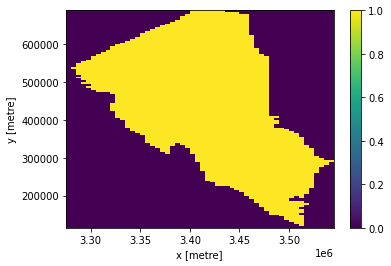

In [14]:
# Create a mask from the county polygon.
kenyan_counties = kenyan_counties.to_crs(output_crs)
mask = xr_rasterize(kenyan_counties[kenyan_counties[attribute_col] == county], ds_rf)

# Mask the rainfall dataset using the county polygon.
# Convert the xarray.Dataset to an xarray.DataArray.
ds_rf = ds_rf.where(mask).rainfall

# Mask the surface temperature dataset using the county polygon.
# Convert the xarray.Dataset to an xarray.DataArray.
ds_st = ds_st.where(mask).surface_temperature

# Mask the NDVI dataset using the county polygon.
# Convert the xarray.Dataset to an xarray.DataArray.
ndvi = ndvi.where(mask).NDVI

# Plot the mask.
mask.plot();

## Load DE Africa's NDVI climatologies

Due to the inconsistent data availability of Landsat 5 over equatorial Africa, and due to persistent cloud coverage over these same regions, the quality of the long-term NDVI baseline is poor in in some parts of Africa. We recommend not using/relying on the NDVI climatology product in locations where the clear obervation count is less than ~20-30 observations. Below this, the standard deviation layers are prone to data artefacts owing to temporal smoothing operations performing poorly on sparse datasets, and residual cloudy pixels not being sufficiently ‘averaged out’ by a decent volume of input data.

In [15]:
# Load the NDVI climatology product.
ds_ndvi_clim = dc.load(product="ndvi_climatology_ls",
                       **query).squeeze()

In [16]:
# Function to get the NDVI climatology mean data for a specific month.
def get_ndvi_climatology_mean(month_no, ds_ndvi_clim, min_num_obs, mask):
    # Map months numbers to string.
    month_no_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
    month_str_list = [
        "jan",
        "feb",
        "mar",
        "apr",
        "may",
        "jun",
        "jul",
        "aug",
        "sep",
        "oct",
        "nov",
        "dec",
    ]
    months = dict(zip(month_no_list, month_str_list))
    # Get the month.
    month = months[month_no]
    # Select the NDVI climatology mean and count data for the month.
    ndvi_clim = ds_ndvi_clim[[f"mean_{month}", f"count_{month}"]]
    # Make a quality assurance mask.
    qa_mask = ds_ndvi_clim[f"count_{month}"] >= min_num_obs
    # Remove pixels where the number of clear observations are less than 'min_num_obs'.
    ndvi_clim = ndvi_clim.where(qa_mask)
    # Mask the dataset using the county boundary.
    ndvi_clim = ndvi_clim.where(mask)
    # Add a dimension to the dataset showing the month number.
    ndvi_clim = ndvi_clim.expand_dims(dim={"month": [month_no]})
    # Select the NDVI climatology mean data for the month.
    ndvi_clim = ndvi_clim[[f"mean_{month}"]]
    # Rename the variable.
    ndvi_clim = ndvi_clim.rename_vars({f"mean_{month}": "NDVI"})
    return ndvi_clim

In [17]:
# Get the NDVI climatology mean data for each month in a year as a separate dataset.
month_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
ndvi_climatology_datasets = [
    get_ndvi_climatology_mean(month_no, ds_ndvi_clim, min_num_obs, mask)
    for month_no in month_list
]
# Merge the datasets into a single dataset based on the dimension "month".
ndvi_climatology = xr.concat(objs=ndvi_climatology_datasets, dim="month")

## Calculate the individual drought indices

In [18]:
# Adjust the range of all variables to avoid a division by zero
ds_rf = ds_rf + 1
ds_st = (ds_st.max() + 1) - ds_st
ndvi = ndvi - (ndvi.min() - 0.01)

In [19]:
# Get the average monthly rainfall in the rainfall time series. 
ds_rf = ds_rf.resample(time="M").mean() # where M is for months.
# Get the average monthly temperature in the temperature time series. 
ds_st = ds_st.resample(time="M").mean() # where M is for months.
# Get the average monthly NDVI in the NDVI time series. 
ndvi = ndvi.resample(time="M").mean() # where M is for months.

In [20]:
# Functions to help calculate the drought indices.
def get_monthly_mean(ds):
    monthly_mean = ds.groupby("time.month").mean("time")
    return monthly_mean

def get_monthly_std(ds):
    monthly_std = ds.groupby("time.month").std("time")
    return monthly_std

def get_continuous_deficit(anomaly):
    # Get some of the features from the anomaly xarray.DataArray to use later.
    dims = list(anomaly.dims)
    coords = anomaly.coords

    # Convert the xarray.DataArray to a numpy array.
    anomaly_np = anomaly.data

    # Numpy array to track the count of negative anomaly values in a sequence for a pixel.
    count = np.zeros(shape=(len(coords["y"]), len(coords["x"])))
    # Numpy array to track the length of a sequence of negative anomaly values for a pixel.
    sequence_length = np.zeros(shape=(len(coords["y"]), len(coords["x"])))

    # Loop over each year present.
    stack_by_year = []
    for year_index in range(anomaly_np.shape[0]):
        year_np = anomaly_np[year_index]

        # Loop over each month in a year.
        stack_by_month = []
        for month_index in range(year_np.shape[0]):
            month_np = year_np[month_index]
            # Increase the count by 1 if the anomaly value for a pixel is negative.
            count = np.where(month_np < 0, count + 1, count)
            # Before resetting the count to zero if the anomaly value for a pixel is positive,
            # check if the current count is more than the length of the sequence of negative anomaly
            # values for a pixel.
            sequence_length = np.where(
                (month_np > 0) & (count > sequence_length), count, sequence_length
            )
            stack_by_month.append(sequence_length)
            # Reset the count to zero if we see a positive anomaly value.
            count = np.where(month_np > 0, 0, count)

        # Stack all the monthly numpy arrays for a single year.
        stacked_by_month = np.stack(stack_by_month, axis=0)
        stack_by_year.append(stacked_by_month)

    # Stack all the yearly numpy arrays together.
    stacked_by_year = np.stack(stack_by_year, axis=0)

    # Create xarray Dataarray.
    continuous_deficit_length = xr.DataArray(
        data=stacked_by_year, coords=coords, dims=dims
    )
    return continuous_deficit_length


def get_continuous_excess(anomaly):
    # Get some of the features from the anomaly xarray.DataArray to use later.
    dims = list(anomaly.dims)
    coords = anomaly.coords

    # Convert the xarray.DataArray to a numpy array.
    anomaly_np = anomaly.data

    # Numpy array to track the count of positive anomaly values in a sequence for a pixel.
    count = np.zeros(shape=(len(coords["y"]), len(coords["x"])))
    # Numpy array to track the length of a sequence of positive anomaly values for a pixel.
    sequence_length = np.zeros(shape=(len(coords["y"]), len(coords["x"])))

    # Loop over each year present.
    stack_by_year = []
    for year_index in range(anomaly_np.shape[0]):
        year_np = anomaly_np[year_index]

        # Loop over each month in a year.
        stack_by_month = []
        for month_index in range(year_np.shape[0]):
            month_np = year_np[month_index]
            # Increase the count by 1 if the anomaly value for a pixel is positive.
            count = np.where(month_np > 0, count + 1, count)
            # Before resetting the count to zero if the anomaly value for a pixel is negative,
            # check if the current count is more than the length of the sequence of positive anomaly
            # values for a pixel.
            sequence_length = np.where(
                (month_np < 0) & (count > sequence_length), count, sequence_length
            )
            stack_by_month.append(sequence_length)
            # Reset the count to zero if we see a negative anomaly value.
            count = np.where(month_np < 0, 0, count)

        # Stack all the monthly numpy arrays for a single year.
        stacked_by_month = np.stack(stack_by_month, axis=0)
        stack_by_year.append(stacked_by_month)

    # Stack all the yearly numpy arrays together.
    stacked_by_year = np.stack(stack_by_year, axis=0)

    # Create xarray Dataarray.
    continuous_excess_length = xr.DataArray(
        data=stacked_by_year, coords=coords, dims=dims,
    )
    return continuous_excess_length


### Precipitation Drought Index 

In [21]:
# Group the average monthly rainfall time series by year then by month.
monthly_mean_rf = ds_rf.groupby("time.year").map(get_monthly_mean).transpose("year", "month", "y", "x")

# From the average monthly time series,
# get the long term average (climatology mean) for each month in a year.
climatology_mean_rf = get_monthly_mean(ds_rf)

# If the average rainfall value for a month is below the long term average 
# rainfall (climatology mean) of a month then the anomaly value will be negative.
anomaly_rf = monthly_mean_rf - climatology_mean_rf

# Get the maximum number of successive months below the long term average rainfall.
# i.e. the length of continuous deficit.
continuous_deficit_length_rf = get_continuous_deficit(anomaly_rf).where(mask)
# Adjust the range of all variables to avoid a division by zero.
continuous_deficit_length_rf = (continuous_deficit_length_rf.max() + 1) - continuous_deficit_length_rf
# Get the long term average of the length of continuous deficit.
long_term_mean_continuous_deficit_length_rf = continuous_deficit_length_rf.groupby("month").mean("year")

In [22]:
%%time
# Calculate the Precipitation Drought Index.
PDI = (monthly_mean_rf / climatology_mean_rf) * np.sqrt(continuous_deficit_length_rf / long_term_mean_continuous_deficit_length_rf)

# Scale the Precipitation Drought Index.
PDI = (PDI - PDI.min()) / (PDI.max() - PDI.min())
PDI = PDI.compute()

# Add a time dimension to the Precipitation Drought Index xarray.DataArray.
time_list = []
data_list = []
for year in PDI.year.values:
    ds_year = PDI.sel(year=year)
    for month in ds_year.month.values:
        ds_month = ds_year.sel(month=month)
        ds_month_np = ds_month.data
        data_list.append(ds_month_np)
        # Specify the time step to be the first day of the month.
        time_step = f"{year}-{month:02}-01"
        time_list.append(time_step)

        
# Convert the time_list to a numpy array.
time = np.array(time_list, dtype='datetime64[ns]')
# Stack the numpy arrays in the data_list.
data = np.stack(data_list, axis=0)

# Initialize xarray.DataArray.
PDI = xr.DataArray(data=data,
                   dims=["time", "y", "x"],
                   coords=dict(time=(["time"], time),
                               y=(["y"], PDI.y.values),
                               x=(["x"], PDI.x.values)))

# Slice the PDI xarray.DataArray to the time range.
PDI = PDI.sel(time=slice(time_range[0], time_range[1]))

PDI

CPU times: user 6.22 s, sys: 272 ms, total: 6.49 s
Wall time: 20.7 s


<xarray.DataArray (time: 458, y: 115, x: 54)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 1984-04-01 1984-05-01 ... 2022-05-01
  * y        (y) float64 6.875e+05 6.825e+05 6.775e+05 ... 1.225e+05 1.175e+05
  * x        (x) float64 3.278e+06 3.282e+06 3.288e+06 ... 3.538e+06 3.542e+06

### Temperature Drought Index

In [23]:
# Group the average monthly temperature time series by year then by month.
monthly_mean_st = ds_st.groupby("time.year").map(get_monthly_mean).transpose("year", "month", "y", "x")

# From the average monthly temperature time series,
# get the long term average temperature (climatology mean) for each month in a year.
climatology_mean_st = get_monthly_mean(ds_st)

# If the average surface temperature value for a month is above 
# the long term average surface temperature then the anomaly value will be positive.
anomaly_st = monthly_mean_st - climatology_mean_st

# Get the maximum number of successive months above the long term average surface temperature.
# i.e. the length of continuous excess.
continuous_excess_length_st = get_continuous_excess(anomaly_st).where(mask)
# Adjust the range of all variables and to avoid a division by zero.
continuous_excess_length_st = (continuous_excess_length_st.max() + 1) - continuous_excess_length_st

# Get the long term average of the length of continuous excess.
long_term_mean_continuous_excess_length_st = continuous_excess_length_st.groupby("month").mean("year")

In [24]:
%%time
# Calculate the Temperature Drought Index.
TDI = (monthly_mean_st / climatology_mean_st) * np.sqrt(continuous_excess_length_st / long_term_mean_continuous_excess_length_st)
# Scale the Temperature Drought Index.
TDI = (TDI - TDI.min()) / (TDI.max() - TDI.min())
TDI = TDI.compute()

# Add a time dimension to the Temperature Drought Index xarray.DataArray.
time_list = []
data_list = []
for year in TDI.year.values:
    ds_year = TDI.sel(year=year)
    for month in ds_year.month.values:
        ds_month = ds_year.sel(month=month)
        ds_month_np = ds_month.data
        data_list.append(ds_month_np)
        # Specify the time step to be the first day of the month.
        time_step = f"{year}-{month:02}-01"
        time_list.append(time_step)

        
# Convert the time_list to a numpy array.
time = np.array(time_list, dtype='datetime64[ns]')
# Stack the numpy arrays in the data_list.
data = np.stack(data_list, axis=0)

# Initialize xarray.DataArray.
TDI = xr.DataArray(data=data,
                   dims=["time", "y", "x"],
                   coords=dict(time=(["time"], time),
                               y=(["y"], TDI.y.values),
                               x=(["x"], TDI.x.values)))


# Slice the TDI xarray.Dataset to the time range
TDI = TDI.sel(time=slice(time_range[0], time_range[1]))

TDI

CPU times: user 1min 5s, sys: 2.18 s, total: 1min 8s
Wall time: 10min 7s


<xarray.DataArray (time: 458, y: 115, x: 54)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 1984-04-01 1984-05-01 ... 2022-05-01
  * y        (y) float64 6.875e+05 6.825e+05 6.775e+05 ... 1.225e+05 1.175e+05
  * x        (x) float64 3.278e+06 3.282e+06 3.288e+06 ... 3.538e+06 3.542e+06

### Vegetation Drought Index

In [25]:
# Group the average monthly NDVI time series by year then by month.
monthly_mean_ndvi = ndvi.groupby("time.year").map(get_monthly_mean).transpose("year", "month", "y", "x")

# Get the long term average NDVI (climatology mean) for each month in a year.
climatology_mean_ndvi = ndvi_climatology.NDVI

# If the average NDVI value for a month is below the 
# long term average NDVI then the anomaly value will be negative.
anomaly_ndvi = monthly_mean_ndvi - climatology_mean_ndvi

# Get the maximum number of successive months below the long term average NDVI
# i.e. the length of continuous deficit.
continuous_deficit_length_ndvi = get_continuous_deficit(anomaly_ndvi).where(mask)
# Adjust the range of all variables and to avoid a division by zero.
continuous_deficit_length_ndvi = (continuous_deficit_length_ndvi.max() + 1) - continuous_deficit_length_ndvi

# Get the long term average of the length of continuous deficit.
long_term_mean_continuous_deficit_length_ndvi = continuous_deficit_length_ndvi.groupby("month").mean("year")

In [26]:
%%time
# Calculate the Vegetation Drought Index.
VDI = (monthly_mean_ndvi / climatology_mean_ndvi) * np.sqrt(continuous_deficit_length_ndvi / long_term_mean_continuous_deficit_length_ndvi)
    
# Scale the Vegetation Drought Index.
VDI = (VDI - VDI.min()) / (VDI.max() - VDI.min())
VDI = VDI.compute()

# Add a time dimension to the Vegetation Drought Index xarray.DataArray.
time_list = []
data_list = []
for year in VDI.year.values:
    ds_year = VDI.sel(year=year)
    for month in ds_year.month.values:
        ds_month = ds_year.sel(month=month)
        ds_month_np = ds_month.data
        data_list.append(ds_month_np)
        # Specify the time step to be the first day of the month.
        time_step = f"{year}-{month:02}-01"
        time_list.append(time_step)
        
        
# Convert the time_list to a numpy array.
time = np.array(time_list, dtype='datetime64[ns]')
# Stack the numpy arrays in the data_list.
data = np.stack(data_list, axis=0)

# Initialize xarray.DataArray.
VDI = xr.DataArray(data=data,
                   dims=["time", "y", "x"],
                   coords=dict(time=(["time"], time),
                               y=(["y"], VDI.y.values),
                               x=(["x"], VDI.x.values)))

# Slice the VDI xarray.Dataset to match the time range.
VDI = VDI.sel(time=slice(time_range[0], time_range[1]))

VDI

CPU times: user 3min 22s, sys: 4.64 s, total: 3min 27s
Wall time: 24min 52s


<xarray.DataArray (time: 458, y: 115, x: 54)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 1984-04-01 1984-05-01 ... 2022-05-01
  * y        (y) float64 6.875e+05 6.825e+05 6.775e+05 ... 1.225e+05 1.175e+05
  * x        (x) float64 3.278e+06 3.282e+06 3.288e+06 ... 3.538e+06 3.542e+06

## Plot the drought indices.

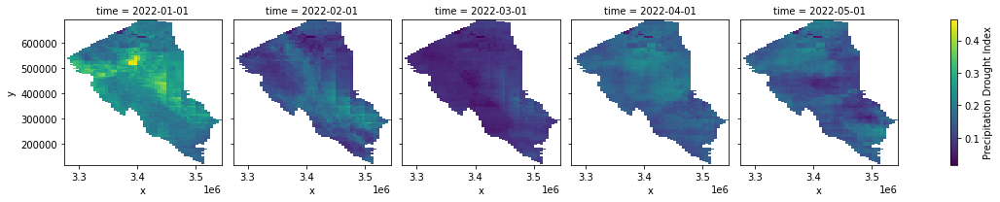

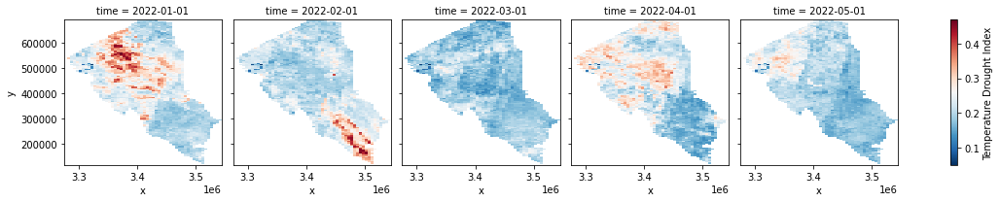

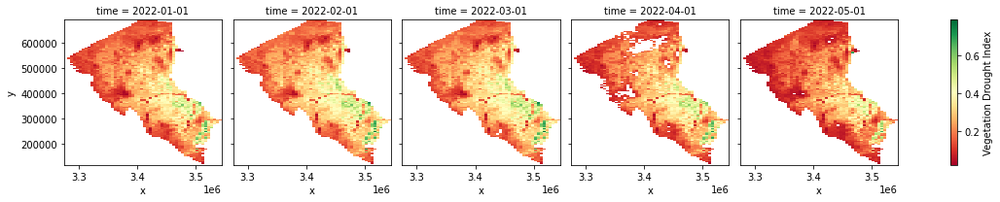

In [27]:
# Plot the drought indices for the year 2022. 
PDI.sel(time=slice("2022-01", "2022-05")).plot(x="x", y="y",col="time", cbar_kwargs={"label": "Precipitation Drought Index"},)
TDI.sel(time=slice("2022-01", "2022-05")).plot(x="x", y="y",col="time", cmap="RdBu_r", cbar_kwargs={"label": "Temperature Drought Index"})
VDI.sel(time=slice("2022-01", "2022-05")).plot(x="x", y="y",col="time", cmap="RdYlGn", cbar_kwargs={"label": "Vegetation Drought Index"});

## Calculate the weights for each drought index

The weight of each individual index is automatically calculated with respect to its capability to reflect the future vegetation status (NDVI).

The Precipitation Drought Index and the Temperature Drought Index are correlated with the Vegetation Drought index via Pearson’s correlation coefficient (R).

In [28]:
%%time
def get_max_correlation_lag(reference_index, drought_index, mask=None):
    # Find the 'lag' value for each pixel, where shifting the time series of the drought_index
    # 'lag' time steps to the right results in the highest correlation with the reference_index.

    # Create xarray.DataArray to track the maximum correlation achieved
    # between the reference_index and the shifted drought_index for each pixel.
    # Starts from correlation with no shift.
    max_correlation = xr.corr(reference_index, drought_index, dim="time")
    # Empty xarray.DataArray to track the lag value at which maximum correlation was achieved
    # between the reference_index and the shifted drought_index for each pixel.
    # Starts from 'lag' value is 0 indicating no shift.
    max_lag = xr.full_like(reference_index.isel(time=0), 0)

    # Lag values to test for.
    # Note the reference_index and drought index must have the same number of time steps.
    lags = list(range(1, len(reference_index.time.values) + 1))

    # Loop over the range of lag values to test (lags).
    for i in lags:
        # Get the correlation between the reference index and the shifted drought index.
        corr = xr.corr(reference_index, drought_index.shift(time=i), dim="time")
        # If the current correlation value (corr) is greater then the max correlation value for a pixel
        # (max_correlation) then assign the current lag value to max_lag.
        max_lag = xr.where(corr > max_correlation, i, max_lag)
        # If the current correlation value (corr) is greater then the max correlation value for a pixel
        # (max_correlation) then assign the corr value to max_correlation.
        max_correlation = xr.where(corr > max_correlation, corr, max_correlation)

    # If there is a mask provided, use it to mask the max_correlation and
    # max_lag xarray.DataArrays.
    if mask is not None:
        max_correlation = max_correlation.where(mask)
        max_lag = max_lag.where(mask)

    return max_correlation, max_lag


PDI_max_correlation, PDI_max_lag = get_max_correlation_lag(reference_index=VDI, drought_index=PDI, mask=mask)
TDI_max_correlation, TDI_max_lag = get_max_correlation_lag(reference_index=VDI, drought_index=TDI, mask=mask)
VDI_max_correlation, VDI_max_lag = get_max_correlation_lag(reference_index=VDI, drought_index=VDI, mask=mask)

CPU times: user 2min 24s, sys: 40.8 s, total: 3min 5s
Wall time: 3min 3s


In [29]:
# The weight of each drought index is automatically calculated with respect to
# its capability to reflect the future vegetation status (NDVI).
# The weights are distributed according to the quality of the correlation
# and the time step at which the highest correlations are observed.
PDI_weight = (((PDI_max_lag / (PDI_max_lag + TDI_max_lag + VDI_max_lag)) * 100) + ((PDI_max_correlation / (PDI_max_correlation + TDI_max_correlation + VDI_max_correlation))* 100)) / 2
TDI_weight = (((TDI_max_lag / (PDI_max_lag + TDI_max_lag + VDI_max_lag)) * 100) + ((TDI_max_correlation / (PDI_max_correlation + TDI_max_correlation + VDI_max_correlation))* 100)) / 2
VDI_weight = (((VDI_max_lag / (PDI_max_lag + TDI_max_lag + VDI_max_lag)) * 100) + (( VDI_max_correlation / (PDI_max_correlation + TDI_max_correlation + VDI_max_correlation)) * 100)) / 2

In [30]:
# The sum of all weights per time step is one or 100%.
np.unique(PDI_weight + TDI_weight + VDI_weight)

array([100., 100., 100., 100.,  nan])

## Enhanced Combine Drought Index

In [31]:
# Calculate the Enhanced Combined Drought Index.
ECDI = (PDI_weight * PDI) + (TDI_weight * TDI) + (VDI_weight * VDI)
ECDI = ECDI.transpose("time", "y", "x")
ECDI

<xarray.DataArray (time: 458, y: 115, x: 54)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * y        (y) float64 6.875e+05 6.825e+05 6.775e+05 ... 1.225e+05 1.175e+05
  * x        (x) float64 3.278e+06 3.282e+06 3.288e+06 ... 3.538e+06 3.542e+06
  * time     (time) datetime64[ns] 1984-04-01 1984-05-01 ... 2022-05-01

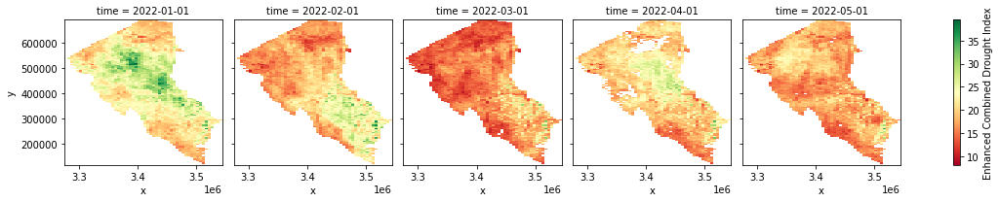

In [32]:
ECDI.sel(time=slice("2022-01", "2022-05")).plot(x="x", y="y",col="time", cmap="RdYlGn", cbar_kwargs={"label": "Enhanced Combined Drought Index"});

## Drought Risk Warning Levels

ECDI based drought risk warning levels (WL) are calculated as follows:


\begin{equation}
\text{WL} = \frac{\text{Current monthly ECDI value} - \text{Average ECDI Value per month}}{\text{Standard Deviation of the monthly ECDI value}}
\end{equation}

The table below compares the ECDI based drought risk warning levels to the MSF food security warning levels. 
<img src="../data/MSFFoodSecurityWarningLevels.png">

In [33]:
# Group the ECDI dataset by year then month.
monthly_mean_ECDI = ECDI.groupby("time.year").map(get_monthly_mean).transpose("year", "month", "y", "x")
# Get the long term average ECDI for each month.
climatology_mean_ECDI = get_monthly_mean(ECDI).transpose("month", "y", "x")
climatology_std_ECDI = get_monthly_std(ECDI).transpose("month", "y", "x")
# Calculate the ECDI based drought risk warning levels.
WL = (monthly_mean_ECDI - climatology_mean_ECDI) / climatology_std_ECDI

In [34]:
# Add a time dimension to the xarray.DataArray.
time_list = []
data_list = []
for year in WL.year.values:
    ds_year = WL.sel(year=year)
    for month in ds_year.month.values:
        ds_month = ds_year.sel(month=month)
        ds_month_np = ds_month.data
        data_list.append(ds_month_np)
        # Specify the time step to be the first day of the month.
        time_step = f"{year}-{month:02}-01"
        time_list.append(time_step)


# Convert the time_list to a numpy array.
time = np.array(time_list, dtype="datetime64[ns]")
# Stack the numpy arrays in the data_list.
data = np.stack(data_list, axis=0)

# Initialize xarray.DataArray.
WL = xr.DataArray(data=data,
                   dims=["time", "y", "x"],
                   coords=dict(time=(["time"], time),
                               y=(["y"], WL.y.values),
                               x=(["x"], WL.x.values)))

WL

<xarray.DataArray (time: 468, y: 115, x: 54)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]])
Coordinates:
  * time     (time) datetime64[ns] 1984-01-01 1984-02-01 ... 2022-12-01
  * y        (y) float64 6.875e+05 6.825e+05 6.775e+05 ... 1.225e+05 1.175e+05
  * x        (x) float64 3.278e+06 3.282e+06 3.288e+06 ... 3.538e+06 3.542e+06

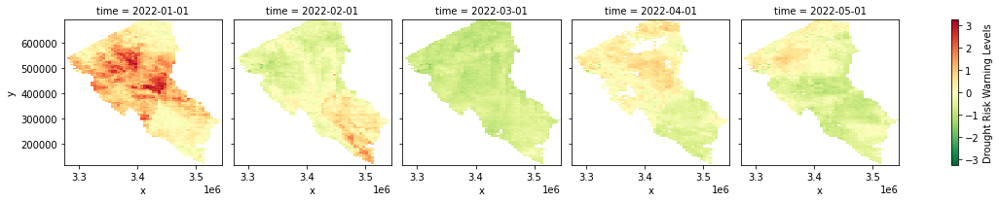

In [35]:
WL.sel(time=slice("2022-01", "2022-05")).plot(x="x", y="y",col="time", cmap="RdYlGn_r", cbar_kwargs={"label": "Drought Risk Warning Levels"});

***

## Additional information

**License:** The code in this notebook is licensed under the [Apache License, Version 2.0](https://www.apache.org/licenses/LICENSE-2.0). 
Digital Earth Africa data is licensed under the [Creative Commons by Attribution 4.0](https://creativecommons.org/licenses/by/4.0/) license.

**Contact:** If you need assistance, please post a question on the [Open Data Cube Slack channel](http://slack.opendatacube.org/) or on the [GIS Stack Exchange](https://gis.stackexchange.com/questions/ask?tags=open-data-cube) using the `open-data-cube` tag (you can view previously asked questions [here](https://gis.stackexchange.com/questions/tagged/open-data-cube)).
If you would like to report an issue with this notebook, you can file one on [Github](https://github.com/digitalearthafrica/deafrica-sandbox-notebooks).

**Compatible datacube version:** 

In [36]:
print(datacube.__version__)

1.8.7


**Last Tested:**

In [37]:
from datetime import datetime

datetime.today().strftime("%Y-%m-%d")

'2022-09-06'